# Using an IMERG Event to Subset SSMI data from STARE-PODS

Michael Lee Rilee, mike@bayesics.com

First version: 2022-0529

In [1]:
import sys
sys.path.insert(0,'/homelocal/mrilee/git/pystareplotlib')

import os
os.environ['PROJ_LIB'] = '/homelocal/mrilee/opt/anaconda3/envs/stare-1/share/proj'

import pystare
import starepandas
import geopandas

import matplotlib.pyplot as plt
import matplotlib.tri as tri
import cartopy
import cartopy.crs as ccrs

import pystareplotlib
import pystareplotlib.pystareplotlib as psplot

import numpy

import pickle
import datetime

plot_options = {'projection': ccrs.PlateCarree(central_longitude=0.0)
                ,'transform': ccrs.Geodetic()}

plot_options['projection']._threshold = 0.01;

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
# Some helper functions

def mnmx(x):
    return min(x),max(x)
def span(x):
    return max(x)-min(x)

In [4]:
start = datetime.datetime.now()

In [5]:
data_dir = '/tablespace/xcal/'
with open(f'{data_dir}/pickles/featuredb.pickle', 'rb') as f:
    features = pickle.load( f)

# Load US States

In [6]:
states = geopandas.read_file('ignored/tl_2019_us_state.zip')

In [7]:
states = starepandas.STAREDataFrame(states)
sids = states.make_sids(n_workers=50, resolution=10)
states.set_sids(sids, inplace=True)
trixels = states.make_trixels(n_workers=50, wrap_lon=False)
states.set_trixels(trixels, inplace=True)
states.split_antimeridian(inplace=True)

In [8]:
roi_name = 'Virginia'
roi = states[states['NAME']==roi_name]
roi_sids = roi.sids.iloc[0]

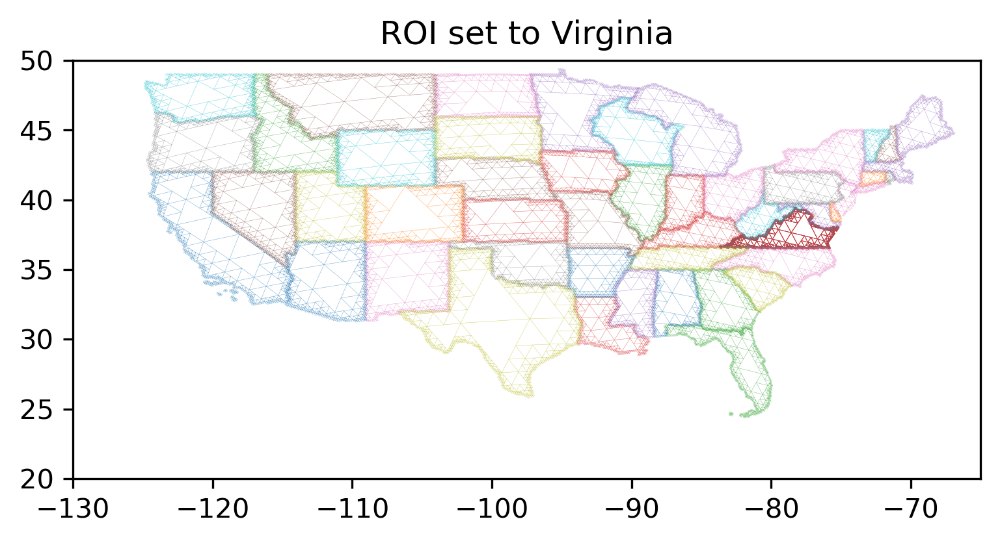

In [9]:
fig = plt.figure(figsize=(6, 3), dpi=300)
ax = fig.add_subplot()

ax.set_xlim(-130, -65)
ax.set_ylim(20, 50)

roi.plot(ax=ax, linewidth=0.2, color='r')
states.plot(ax=ax, column='NAME', linewidth=0.1, alpha=0.4)

plt.title('ROI set to %s'%roi_name)
plt.show()

del fig,ax

# Pull out events intersecting the region of interest (ROI)

In [10]:
intersects = features.stare_intersects(roi_sids, n_workers=60)
features[intersects].label.unique()

array([17, 65, 79, 91, 94], dtype=int32)

# Inspecting the first event (17)

In [11]:
event_17 = features[features.label==17]

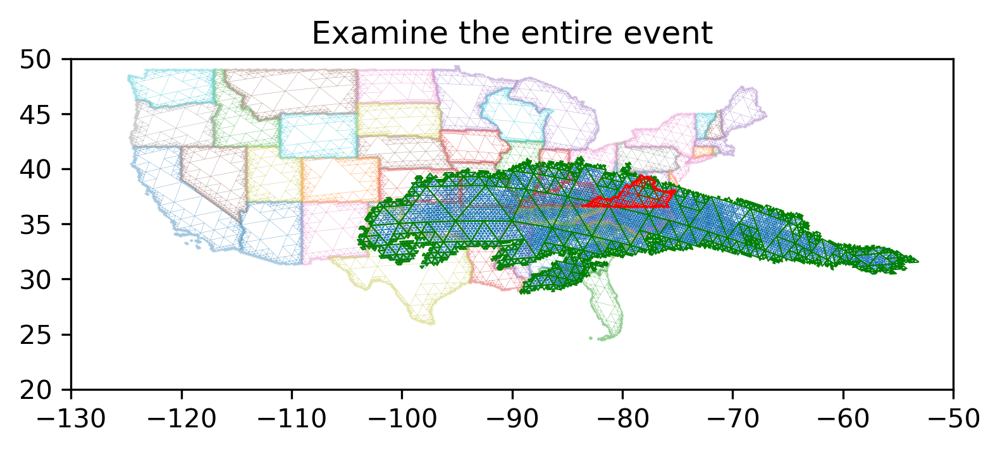

In [12]:
fig = plt.figure(figsize=(6, 3), dpi=300)
ax = fig.add_subplot()

ax.set_xlim(-130, -65+15)
ax.set_ylim(20, 50)

states.plot(ax=ax, column='NAME', linewidth=0.1, alpha=0.4)

dissolved_sids = event_17.stare_dissolve()
dissolved_event = starepandas.STAREDataFrame(sids=[dissolved_sids])
trixels = dissolved_event.make_trixels()
dissolved_event.set_trixels(trixels, inplace=True)

dissolved_event.plot(ax=ax, zorder=2, linewidth=0.5, color='g')

event_17.plot(ax=ax, zorder=1, linewidth=0.1)
roi.plot(ax=ax, zorder=3, color='r', linewidth=0.2)

plt.title('Examine the entire event')
plt.show()

del fig,ax

# Calculating precip 

## Precip for the whole event

In [13]:
tot_precip = event_17.tot_precip.sum()
print(f'Total Precip: {tot_precip:,.2f} cubic meters')

Total Precip: 61,980,755,210.15 cubic meters


## Getting timeframes of the event that intersected roi

In [14]:
intersects = event_17.stare_intersects(roi_sids)
over_roi = event_17.reset_index()[intersects]

## Getting the cells/sids/trixels that intersect roi

In [15]:
over_roi['in'] =  over_roi['sids'].apply(lambda row: pystare.intersects(roi_sids, row))

## Calculating Total Precip over roi

In [16]:
def calc_tot_precip(row):
    return (row['cell_areas']*row['precips']/1000/2*row['in']).sum()
    
over_roi['precip_in_roi'] = over_roi.apply(lambda row: calc_tot_precip(row), axis=1)

In [17]:
roi_precip = over_roi['precip_in_roi'].sum()
roi_precip_share = roi_precip/tot_precip * 100
print(f'Share of event 17 in roi is {roi_precip_share:2.2f} %')

Share of event 17 in roi is 7.89 %


# Total Runtime

In [18]:
print(datetime.datetime.now()-start)

0:01:30.273276


In [19]:
event_17.timestamp.max()-event_17.timestamp.min()

Timedelta('2 days 12:30:00')

In [20]:
over_roi.timestamp.max()-over_roi.timestamp.min()

Timedelta('1 days 04:30:00')

In [21]:
event_17.timestamp.min(),event_17.timestamp.max()

(Timestamp('2021-01-24 20:30:00'), Timestamp('2021-01-27 09:00:00'))

## Take a look at the ROI and the event

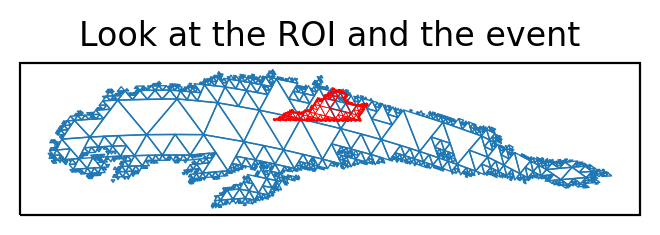

In [22]:
usr_figax = psplot.FigAxContainer(
    plt.subplots(figsize=(4,4), dpi=200
    ,subplot_kw=plot_options))

dissolved_event.plot(ax=usr_figax.ax,lw=0.5)
roi.plot(ax=usr_figax.ax,color='r',lw=0.25)

plt.title('Look at the ROI and the event')
plt.show()


del usr_figax

In [23]:
# Take advantage of the fact that the resolution is all finer than 4 and 4 is the size of the pods.
print(mnmx(dissolved_event.sids.values[0] & 31 ))
dissolved_event_sids=starepandas.STAREDataFrame(sids=numpy.unique(pystare.spatial_clear_to_resolution(pystare.spatial_coerce_resolution(dissolved_event.sids.values[0],4)))).hex()

(5, 9)


In [24]:
b = numpy.unique(pystare.spatial_clear_to_resolution(pystare.spatial_coerce_resolution(dissolved_event.sids.values[0],4)))

In [25]:
# b

## Check that the pods we're loading cover the event

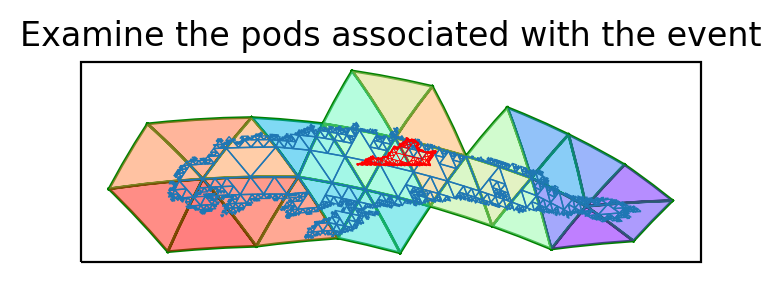

In [26]:
usr_figax = psplot.FigAxContainer(
    plt.subplots(figsize=(4,4), dpi=200
    ,subplot_kw=plot_options))

dissolved_event.plot(ax=usr_figax.ax,lw=0.5)
roi.plot(ax=usr_figax.ax,color='r',lw=0.25)
# b = dissolved_event_sids

zs = numpy.asarray(range(1*len(b)),dtype=float)/(1.0*len(b))
tripcolor_alpha = 0.5
cd_cmap=plt.cm.get_cmap('rainbow')

usr_figax, sivs_cache, sivs_triang = psplot.hello_plot(
    b,usr_figax,rasterized=True,plot_options=plot_options,color='g'
    ,show_fig=False
    ,face_zs = zs
    ,face_cmap   = cd_cmap
    ,face_alpha  = tripcolor_alpha
    ,face_vmin   = min(zs)
    ,face_vmax   = max(zs)
    ,face_shading = 'gouraud'
    ,verbose = False
)
plt.title('Examine the pods associated with the event')
plt.show()

del usr_figax

## Set the regex pattern for the pods to subset

In [27]:
# The current prototype STARE-PODS uses only STARE/HTM (spatial) indexing, not temporal
# pattern='S1.1C.F16.*2021012[4567].*'
# pattern='S1.1C.F16.*20210124.*'
pattern='S1\.1C..*\.2021012[4567].*'

## Set the STARE region to read from pods

In [28]:
# sids_=['0x2220000000000004']

# Load all of the data from the event
sids_=dissolved_event_sids

In [29]:
s1 = starepandas.read_pods(pod_root='/tablespace/xcal/starepods/', sids=sids_, pattern=pattern, add_podname=True)

In [30]:
print('{:8} {}'.format('Platform','IFOVs loaded'))
print('-------- ------------')
for k in ['F16','F17','F18','NOAA20','NPP']:
    print('{:8} {}'.format(k,s1[s1.pod.str.contains(k)].size))

Platform IFOVs loaded
-------- ------------
F16      1515288
F17      1537400
F18      1518640
NOAA20   1129296
NPP      1152384


In [31]:
# s1

In [32]:
# s1[s1.pod.str.contains('ATMS')]

In [33]:
# s1[s1.pod.str.contains('F17')]

In [34]:
# s1.pod.values.size

In [35]:
# s1.pod.values

In [36]:
s1.set_sids('stare',inplace=True)
s1.set_trixels(s1.make_trixels(n_workers=50, wrap_lon=False),inplace=True)
# s1.split_antimeridian(inplace=True)

In [37]:
s1['level']=2**(10-pystare.spatial_resolution(s1['stare']))

In [38]:
s1.set_geometry(geopandas.points_from_xy(s1.lon, s1.lat, crs=4326), inplace=True)
# s1_.set_trixels(s1_.make_trixels(n_workers=600), inplace=True)

In [39]:
s1.reset_index(inplace=True)

## Restrict (subset) the data to the ROI

In [40]:
# mask = s1.stare_intersects(dissolved_event['sids'].iloc[0])

# Set the ROI to the entire event
mask_name = "ROI=Event"
mask = s1.stare_intersects(dissolved_event.sids.values[0])

# Set the ROI to the roi (state) set above
# mask_name = roi_name
# mask = s1.stare_intersects(roi_sids)

s1_ = s1.reset_index()[mask]
mnmx(pystare.spatial_resolution(s1_.stare))

In [42]:
# bounds = roi.bounds.values.flatten(); bounds

In [43]:
# bbox = [bounds[0],bounds[2],bounds[1],bounds[3]]; bbox

## Examine the data loaded from the PODS and subsetted to the mask

F16  size:  966355
F17  size:  1003340
F18  size:  962312
NOAA20  size:  764738
NPP  size:  756925


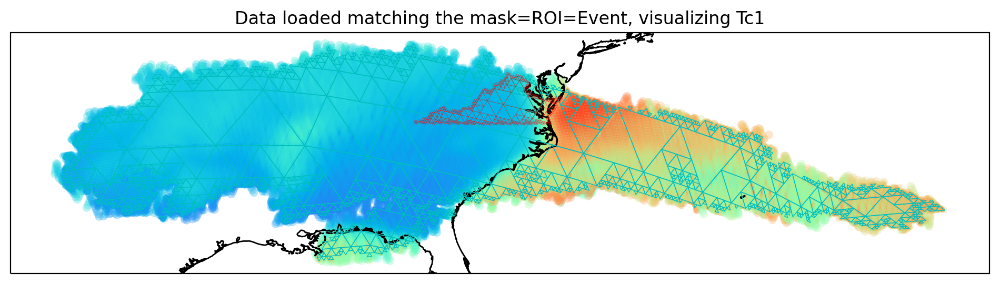

In [44]:
# proj = cartopy.crs.NearsidePerspective(central_longitude=-110, central_latitude=20)

usr_figax = psplot.FigAxContainer(
    plt.subplots(figsize=(12,6), dpi=200
    ,subplot_kw=plot_options))

transf = plot_options['transform']

ax = usr_figax.ax
    
ax.coastlines()
# ax.set_extent([-125, -55, 24, 50])
# ax.set_extent([-75, -65, 32, 42])
# ax.set_extent([-82.5, -72.5, 35, 40])
# ax.set_extent([-179, -50, 90, 10])
#ax.set_extent(bbox)

# roi.boundary.plot(ax=ax, transform=transf, lw=0.5, color='r')

#++ s1_.plot(ax=ax, trixels=True, lw=0.1, color='b', transform=transf, markersize=1)
# s1_.plot(ax=ax, column='Tc1', trixels=False, lw=0.1, transform=transf, markersize=10*s1_['level'], alpha=0.125, cmap='rainbow_r')

# s1_a = s1_[9540:9550]

colors={
    'F16':'r'
    ,'F17':'g'
    ,'F18':'b'
    ,'NOAA20':'y'
    ,'NPP':'c'
}

var_name='Tc1'

vmin = min(s1_[var_name])
vmax = max(s1_[var_name])

for i, (k,v) in enumerate(colors.items()):
    s_ = s1_[s1_.pod.str.contains(k)]
    l  = 1
    print(k,' size: ',s_.size)
    if s_.size > 0:
        #++ 
        s_.plot(ax=ax, column=var_name, trixels=False, lw=0.1, transform=transf, markersize=4*s_['level'], alpha=0.3, cmap='rainbow_r',vmin=vmin,vmax=vmax)
        # s_.plot(ax=ax, trixels=False, lw=0.1, transform=transf, markersize=1, alpha=0.5, color=v)

        # b = [4282096412885254152]
        # b=s_.stare
        # usr_figax, sivs_cache, sivs_triang = psplot.hello_plot(b,usr_figax,rasterized=True,plot_options=plot_options,color=v,show_fig=False)
        
dissolved_event.plot(ax=ax, zorder=2, linewidth=0.5, color='c')
roi.plot(ax=ax, zorder=3, linewidth=0.2, color='r',alpha=0.5)

plt.title('Data loaded matching the mask=%s, visualizing %s'%(mask_name,var_name))
plt.show()
        
# Add a column with the resolution level to set the markersize.
del usr_figax,ax

## Zoom in to see some detail

F16  size:  966355
F17  size:  1003340
F18  size:  962312
NOAA20  size:  764738
NPP  size:  756925


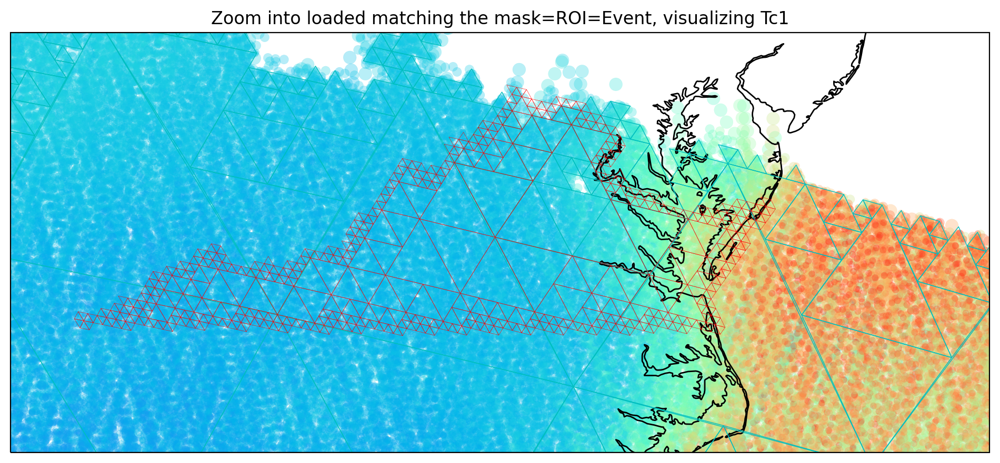

In [45]:
# proj = cartopy.crs.NearsidePerspective(central_longitude=-110, central_latitude=20)

usr_figax = psplot.FigAxContainer(
    plt.subplots(figsize=(12,6), dpi=200
    ,subplot_kw=plot_options))

transf = plot_options['transform']

ax = usr_figax.ax
    
ax.coastlines()
# ax.set_extent([-125, -55, 24, 50])
# ax.set_extent([-75, -65, 32, 42])
ax.set_extent([-84.5, -72.5, 35, 40])
# ax.set_extent([-179, -50, 90, 10])
#ax.set_extent(bbox)

# roi.boundary.plot(ax=ax, transform=transf, lw=0.5, color='r')

#++ s1_.plot(ax=ax, trixels=True, lw=0.1, color='b', transform=transf, markersize=1)
# s1_.plot(ax=ax, column='Tc1', trixels=False, lw=0.1, transform=transf, markersize=10*s1_['level'], alpha=0.125, cmap='rainbow_r')

# s1_a = s1_[9540:9550]

colors={
    'F16':'r'
    ,'F17':'g'
    ,'F18':'b'
    ,'NOAA20':'y'
    ,'NPP':'c'
}

var_name = 'Tc1'

vmin = min(s1_[var_name])
vmax = max(s1_[var_name])

for i, (k,v) in enumerate(colors.items()):
    s_ = s1_[s1_.pod.str.contains(k)]
    l  = 1
    print(k,' size: ',s_.size)
    if s_.size > 0:
        #++ 
        s_.plot(ax=ax, column=var_name, trixels=False, lw=0.1, transform=transf, markersize=10*s_['level'], alpha=0.3, cmap='rainbow_r',vmin=vmin,vmax=vmax)
        # s_.plot(ax=ax, trixels=False, lw=0.1, transform=transf, markersize=1, alpha=0.5, color=v)

        # b = [4282096412885254152]
        # b=s_.stare
        # usr_figax, sivs_cache, sivs_triang = psplot.hello_plot(b,usr_figax,rasterized=True,plot_options=plot_options,color=v,show_fig=False)
        
# dissolved_event.plot(ax=ax, zorder=2, linewidth=0.5, color='r')
# roi.plot(ax=ax,zorder=2,linewidth=0.4,color='k')

dissolved_event.plot(ax=ax, zorder=2, linewidth=0.5, color='c')
roi.plot(ax=ax, zorder=3, linewidth=0.2, color='r')

plt.title('Zoom into loaded matching the mask=%s, visualizing %s'%(mask_name,var_name))
plt.show()
        
# Add a column with the resolution level to set the markersize.
del usr_figax,ax

## Look at the IFOVs colored according to their source platform

F16      size: 966355
F17      size: 1003340
F18      size: 962312
NOAA20   size: 764738
NPP      size: 756925

Colors

F16          r
F17          g
F18          b
NOAA20       y
NPP          c


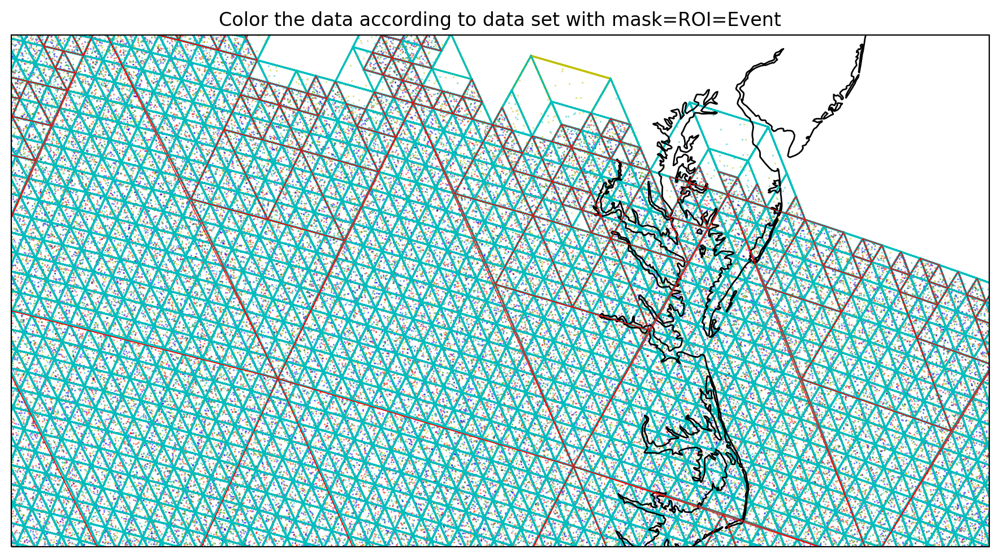

In [46]:
# proj = cartopy.crs.NearsidePerspective(central_longitude=-110, central_latitude=20)

usr_figax = psplot.FigAxContainer(
    plt.subplots(figsize=(12,6), dpi=200
    ,subplot_kw=plot_options))

transf = plot_options['transform']

ax = usr_figax.ax
    
ax.coastlines()
# ax.set_extent([-125, -55, 24, 50])
# ax.set_extent([-75, -65, 32, 42])
# ax.set_extent([-82.5, -72.5, 35, 40])
ax.set_extent([-84.5, -72.5, 35, 40])
# ax.set_extent([-179, -50, 90, 10])
#ax.set_extent(bbox)

# roi.boundary.plot(ax=ax, transform=transf, lw=0.5, color='r')

#++ s1_.plot(ax=ax, trixels=True, lw=0.1, color='b', transform=transf, markersize=1)
# s1_.plot(ax=ax, column='Tc1', trixels=False, lw=0.1, transform=transf, markersize=10*s1_['level'], alpha=0.125, cmap='rainbow_r')

# s1_a = s1_[9540:9550]

colors={
    'F16':'r'
    ,'F17':'g'
    ,'F18':'b'
    ,'NOAA20':'y'
    ,'NPP':'c'
}

for i, (k,v) in enumerate(colors.items()):
    s_ = s1_[s1_.pod.str.contains(k)]
    l  = 1
    print('{:8} size: {}'.format(k,s_.size))
    if s_.size > 0:
        #++ 
        # s_.plot(ax=ax, column='Tc1', trixels=False, lw=0.1, transform=transf, markersize=2*s_['level'], alpha=0.4, cmap='rainbow_r')
        s_.plot(ax=ax, trixels=False, lw=0.1, transform=transf, markersize=1, alpha=0.5, color=v)

        # b = [4282096412885254152]
        b=s_.stare
        usr_figax, sivs_cache, sivs_triang = psplot.hello_plot(b,usr_figax,rasterized=True,plot_options=plot_options,color=v,show_fig=False)
        
dissolved_event.plot(ax=ax, zorder=2, linewidth=0.5, color='r')

plt.title('Color the data according to data set with mask=%s'%mask_name)

print('\nColors\n')
for i, (k,v) in enumerate(colors.items()):
    print('{:12} {}'.format(k,v))
plt.show()
        
# Add a column with the resolution level to set the markersize.
del usr_figax,ax

## Now focus on subsetting with mask=Virginia

In [47]:
# mask = s1.stare_intersects(dissolved_event['sids'].iloc[0])

# Set the ROI to the entire event
# mask_name = "ROI=Event"
# mask = s1.stare_intersects(dissolved_event.sids.values[0])

# Set the ROI to the roi (state) set above
mask_name = roi_name
mask = s1.stare_intersects(roi_sids)

s1_ = s1.reset_index()[mask]
mnmx(pystare.spatial_resolution(s1_.stare))

(7, 9)

F16  size:  48698
F17  size:  45617
F18  size:  49556
NOAA20  size:  36998
NPP  size:  40014


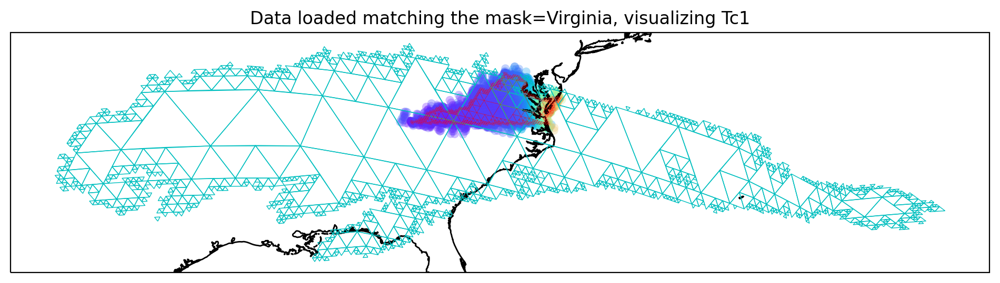

In [48]:
# proj = cartopy.crs.NearsidePerspective(central_longitude=-110, central_latitude=20)

usr_figax = psplot.FigAxContainer(
    plt.subplots(figsize=(12,6), dpi=200
    ,subplot_kw=plot_options))

transf = plot_options['transform']

ax = usr_figax.ax
    
ax.coastlines()
# ax.set_extent([-125, -55, 24, 50])
# ax.set_extent([-75, -65, 32, 42])
# ax.set_extent([-82.5, -72.5, 35, 40])
# ax.set_extent([-179, -50, 90, 10])
#ax.set_extent(bbox)

# roi.boundary.plot(ax=ax, transform=transf, lw=0.5, color='r')

#++ s1_.plot(ax=ax, trixels=True, lw=0.1, color='b', transform=transf, markersize=1)
# s1_.plot(ax=ax, column='Tc1', trixels=False, lw=0.1, transform=transf, markersize=10*s1_['level'], alpha=0.125, cmap='rainbow_r')

# s1_a = s1_[9540:9550]

colors={
    'F16':'r'
    ,'F17':'g'
    ,'F18':'b'
    ,'NOAA20':'y'
    ,'NPP':'c'
}

var_name='Tc1'

vmin = min(s1_[var_name])
vmax = max(s1_[var_name])

for i, (k,v) in enumerate(colors.items()):
    s_ = s1_[s1_.pod.str.contains(k)]
    l  = 1
    print(k,' size: ',s_.size)
    if s_.size > 0:
        #++ 
        s_.plot(ax=ax, column=var_name, trixels=False, lw=0.1, transform=transf, markersize=4*s_['level'], alpha=0.3, cmap='rainbow_r',vmin=vmin,vmax=vmax)
        # s_.plot(ax=ax, trixels=False, lw=0.1, transform=transf, markersize=1, alpha=0.5, color=v)

        # b = [4282096412885254152]
        # b=s_.stare
        # usr_figax, sivs_cache, sivs_triang = psplot.hello_plot(b,usr_figax,rasterized=True,plot_options=plot_options,color=v,show_fig=False)
        
dissolved_event.plot(ax=ax, zorder=2, linewidth=0.5, color='c')
roi.plot(ax=ax, zorder=3, linewidth=0.2, color='r',alpha=0.5)

plt.title('Data loaded matching the mask=%s, visualizing %s'%(mask_name,var_name))
plt.show()
        
# Add a column with the resolution level to set the markersize.
del usr_figax,ax

F16  size:  48698
F17  size:  45617
F18  size:  49556
NOAA20  size:  36998
NPP  size:  40014


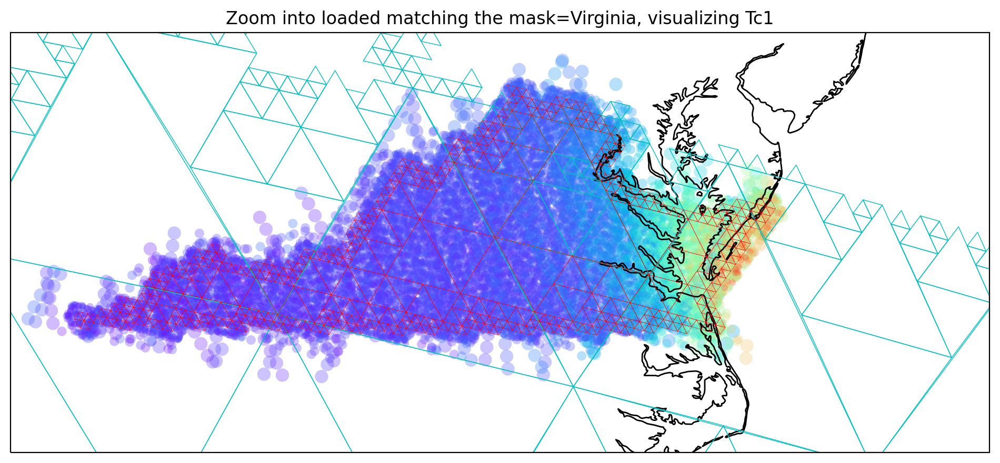

In [49]:
# proj = cartopy.crs.NearsidePerspective(central_longitude=-110, central_latitude=20)

usr_figax = psplot.FigAxContainer(
    plt.subplots(figsize=(12,6), dpi=200
    ,subplot_kw=plot_options))

transf = plot_options['transform']

ax = usr_figax.ax
    
ax.coastlines()
# ax.set_extent([-125, -55, 24, 50])
# ax.set_extent([-75, -65, 32, 42])
ax.set_extent([-84.5, -72.5, 35, 40])
# ax.set_extent([-179, -50, 90, 10])
#ax.set_extent(bbox)

# roi.boundary.plot(ax=ax, transform=transf, lw=0.5, color='r')

#++ s1_.plot(ax=ax, trixels=True, lw=0.1, color='b', transform=transf, markersize=1)
# s1_.plot(ax=ax, column='Tc1', trixels=False, lw=0.1, transform=transf, markersize=10*s1_['level'], alpha=0.125, cmap='rainbow_r')

# s1_a = s1_[9540:9550]

colors={
    'F16':'r'
    ,'F17':'g'
    ,'F18':'b'
    ,'NOAA20':'y'
    ,'NPP':'c'
}

var_name = 'Tc1'

vmin = min(s1_[var_name])
vmax = max(s1_[var_name])

for i, (k,v) in enumerate(colors.items()):
    s_ = s1_[s1_.pod.str.contains(k)]
    l  = 1
    print(k,' size: ',s_.size)
    if s_.size > 0:
        #++ 
        s_.plot(ax=ax, column=var_name, trixels=False, lw=0.1, transform=transf, markersize=10*s_['level'], alpha=0.3, cmap='rainbow_r',vmin=vmin,vmax=vmax)
        # s_.plot(ax=ax, trixels=False, lw=0.1, transform=transf, markersize=1, alpha=0.5, color=v)

        # b = [4282096412885254152]
        # b=s_.stare
        # usr_figax, sivs_cache, sivs_triang = psplot.hello_plot(b,usr_figax,rasterized=True,plot_options=plot_options,color=v,show_fig=False)
        
# dissolved_event.plot(ax=ax, zorder=2, linewidth=0.5, color='r')
# roi.plot(ax=ax,zorder=2,linewidth=0.4,color='k')

dissolved_event.plot(ax=ax, zorder=2, linewidth=0.5, color='c')
roi.plot(ax=ax, zorder=3, linewidth=0.2, color='r')

plt.title('Zoom into loaded matching the mask=%s, visualizing %s'%(mask_name,var_name))
plt.show()
        
# Add a column with the resolution level to set the markersize.
del usr_figax,ax